<a href="https://colab.research.google.com/github/alexandrasouly/fastai_exploration/blob/main/lesson_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
!pip install -Uqq fastbook
import fastbook
fastbook.setup_book()

     |████████████████████████████████| 727kB 7.6MB/s 
     |████████████████████████████████| 194kB 45.4MB/s 
     |████████████████████████████████| 51kB 6.3MB/s 
     |████████████████████████████████| 1.2MB 27.3MB/s 
     |████████████████████████████████| 61kB 8.1MB/s 
     |████████████████████████████████| 61kB 8.3MB/s 
Mounted at /content/gdrive


In [13]:
from fastai.vision.widgets import *
import getpass
azure_api_key = getpass.getpass()

··········


In [14]:
from fastbook import *
from fastai.vision.widgets import *

FastAI has a function that downloads images through the Bing API.
It returns not a list, but FastAI's own type, L() this is similar to a numpy list. attrgot() is implemented on L(), that get the values for each list element's dictionary key specified. Docs are here: https://fastcore.fast.ai/foundation.html#L.attrgot

In [10]:
results = search_images_bing(azure_api_key, 'grizzly bear')
ims = results.attrgot('contentUrl')
len(ims)


150

To save and show an image, there are lots of handy built-in functions too. FastAI also has the download_url function, that download any file from url to destination. 
They have implemented lots of helpers on the Image class too,like to_thumb. Docs are here: https://docs.fast.ai/vision.core.html

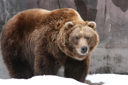

In [25]:
path = Path("images")
path.mkdir()
dest = 'images/grizzly.jpg'
download_url(ims[0], dest)
im = Image.open(dest)
im.to_thumb(128,128)


In [27]:
type(im)

PIL.JpegImagePlugin.JpegImageFile

We will build a model that recognises ballet, pole fitness and gymnastics. 
We first get pictures for each from Bing. FastAI has a very handy download_images function, docs at https://docs.fast.ai/vision.utils.html

In [15]:
sports = ['gymnastics', 'pole fitness', 'ballet']
path = Path('sports')
if path.exists(): # avoiding accidentally rerunning API calls
  path.mkdir(exist_ok=True)
  for sport in sports:
      dest = path/sport # I didn't know you could do this wiht Path(), so cool
      dest.mkdir(exist_ok=True)
      results = search_images_bing(azure_api_key, sport)
      download_images(dest, urls=results.attrgot('contentUrl'))

We verify that everything worked:
get_image_files just returns the image files in the path directory. We can also check if downloads failed, verify_images() tries to open the files. To remove the corrupt ones, we can use unlink with the L object's map method. This calls the passed Path.unlink() function on each element of the L list. Unlink is just Unix for "remove"

In [16]:
path = Path('sports')
fns = get_image_files(path)
display(fns)

failed = verify_images(fns)
display(failed)
failed.map(Path.unlink);

(#419) [Path('sports/pole fitness/00000110.jpg'),Path('sports/pole fitness/00000137.jpg'),Path('sports/pole fitness/00000134.jpg'),Path('sports/pole fitness/00000025.jpg'),Path('sports/pole fitness/00000091.jpg'),Path('sports/pole fitness/00000107.jpg'),Path('sports/pole fitness/00000013.jpeg'),Path('sports/pole fitness/00000093.jpg'),Path('sports/pole fitness/00000117.jpg'),Path('sports/pole fitness/00000043.png')...]

(#4) [Path('sports/pole fitness/00000118.jpg'),Path('sports/ballet/00000006.jpg'),Path('sports/ballet/00000029.jpg'),Path('sports/ballet/00000112.jpg')]

In FastAI, use DataLoaders to prepare data to use with the models. They also do train/test splits. 
DataLoaders: A fastai class that stores multiple DataLoader objects you pass to it, normally a train and a valid, although it's possible to have as many as you like. The first two are made available as properties.

Let's look at each of these arguments in turn. First we provide a tuple where we specify what types we want for the independent and dependent variables.

For this DataLoaders our underlying items will be file paths. We have to tell fastai how to get a list of those files. The get_image_files function takes a path, and returns a list of all of the images in that path (recursively, by default).

Often, datasets that you download will already have a validation set defined. Sometimes this is done by placing the images for the training and validation sets into different folders. Sometimes it is done by providing a CSV file in which each filename is listed along with which dataset it should be in. There are many ways that this can be done, and fastai provides a very general approach that allows you to use one of its predefined classes for this, or to write your own. In this case, however, we simply want to split our training and validation sets randomly. However, we would like to have the same training/validation split each time we run this notebook, so we fix the random seed (computers don't really know how to create random numbers at all, but simply create lists of numbers that look random; if you provide the same starting point for that list each time—called the seed—then you will get the exact same list each time).

The independent variable is often referred to as x and the dependent variable is often referred to as y. Here, we are telling fastai what function to call to create the labels in our dataset. parent_label is a function provided by fastai that simply gets the name of the folder a file is in. Because we put each of our  images into folders based on the type of sport, this is going to give us the labels that we need.

Our images are all different sizes, and this is a problem for deep learning: we don't feed the model one image at a time but several of them (what we call a mini-batch). To group them in a big array (usually called a tensor) that is going to go through our model, they all need to be of the same size. So, we need to add a transform which will resize these images to the same size. Item transforms are pieces of code that run on each individual item, whether it be an image, category, or so forth. fastai includes many predefined transforms; we use the Resize transform here.


In [17]:
sports_data_block = DataBlock(
    blocks=(ImageBlock, CategoryBlock), 
    get_items=get_image_files, 
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=Resize(128))

This command has given us a DataBlock object. This is like a template for creating a DataLoaders. We still need to tell fastai the actual source of our data—in this case, the path where the images can be found. A DataLoaders includes validation and training DataLoaders. DataLoader is a class that provides batches of a few items at a time to the GPU. We'll be learning a lot more about this class in the next chapter. When you loop through a DataLoader fastai will give you 64 (by default) items at a time, all stacked up into a single tensor. We can take a look at a few of those items by calling the show_batch method on a DataLoader.

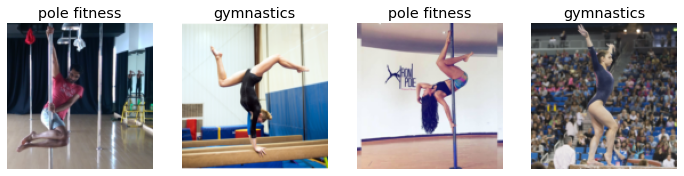

In [18]:
dls = sports_data_block.dataloaders(path)
dls.valid.show_batch(max_n=4, nrows=1)

Now we use image augmentation. unique = true shows us the same image with different augmentations. We would normally use RandomResizedCrop, but to keep the augmentation easier to see, we use Resize only here.

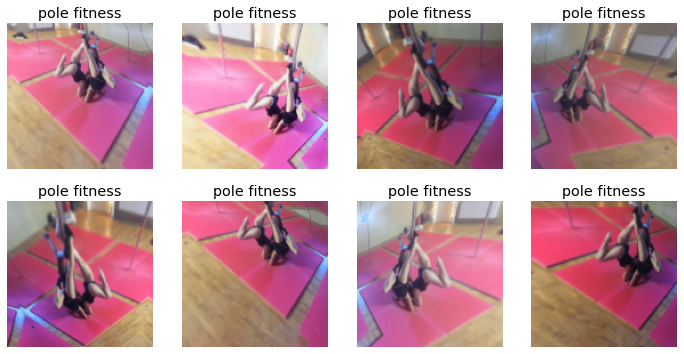

In [20]:
sports_data_block = sports_data_block.new(item_tfms=Resize(128), batch_tfms=aug_transforms(mult=2))
dls = sports_data_block.dataloaders(path)
dls.train.show_batch(max_n=8, nrows=2, unique=True)

To actually train the model, we will use RandomResizedCrop. 224 px is a standard image size for classification.

In [21]:
sports_data_block = sports_data_block.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms())
dls = sports_data_block.dataloaders(path)

We use a CNN ResNet architechture. This uses the pretrained weights of RaesNet18, and fine-tunes them with four cycles. 

In [22]:
learn = cnn_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(4)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


epoch,train_loss,valid_loss,error_rate,time
0,1.788118,1.210643,0.373494,01:13


epoch,train_loss,valid_loss,error_rate,time
0,0.558077,0.206416,0.072289,01:28
1,0.416462,0.169162,0.036145,01:27
2,0.340696,0.175797,0.048193,01:27
3,0.270618,0.179179,0.048193,01:27



To visualize the mistakes, we can create a confusion matrix. It seems like it had trouble with pole, and got 4 pictures wrongs. Lets plot them too.

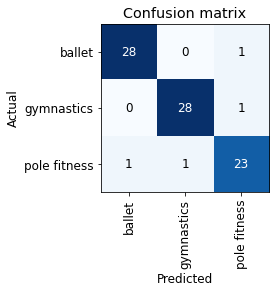

In [23]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

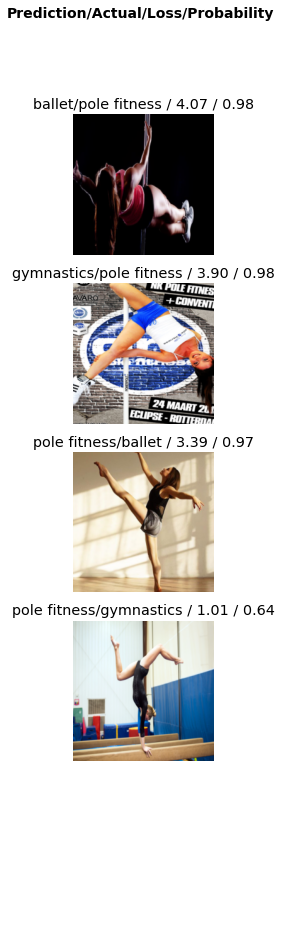

In [28]:
interp.plot_top_losses(4, nrows=5)

The intuitive approach to doing data cleaning is to do it before you train a model. But as you've seen in this case, a model can actually help you find data issues more quickly and easily. So, we normally prefer to train a quick and simple model first, and then use it to help us with data cleaning.

fastai includes a handy GUI for data cleaning called ImageClassifierCleaner that allows you to choose a category and the training versus validation set and view the highest-loss images (in order), along with menus to allow images to be selected for removal or relabeling:

We have a couple of images that are not pole, but hoop or splits. We can see how the dataset cleaner works and delete these pictures:

In [29]:
cleaner = ImageClassifierCleaner(learn)
cleaner

In [30]:
# for idx in cleaner.delete():
#   cleaner.fns[idx].unlink()


Now let's retrain the model.

In [31]:
learn.fine_tune(4)

epoch,train_loss,valid_loss,error_rate,time
0,0.134062,0.190878,0.072289,01:14


epoch,train_loss,valid_loss,error_rate,time
0,0.116812,0.170238,0.072289,01:31
1,0.096753,0.171038,0.096386,01:29
2,0.073791,0.161314,0.072289,01:27
3,0.069214,0.161390,0.072289,01:30


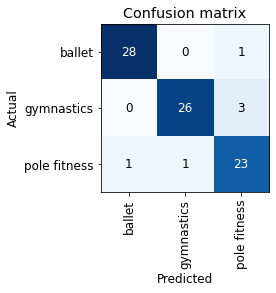

In [32]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

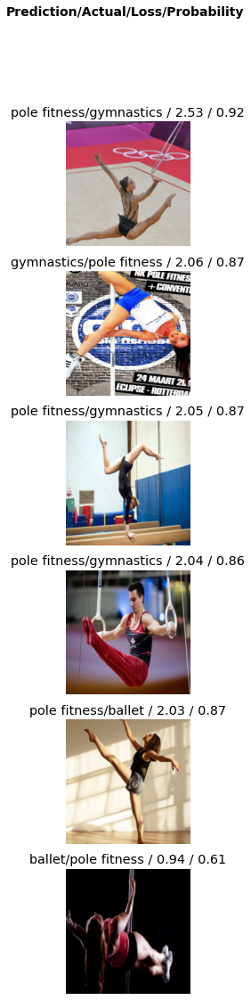

In [33]:
interp.plot_top_losses(6, nrows=6)

Interesting, once we got the not pole pictures deleted, we misclassify more pictures, but we are less certain in the ones we get wrong.

Once you've got a model you're happy with, you need to save it, so that you can then copy it over to a server where you'll use it in production. Remember that a model consists of two parts: the architecture and the trained parameters. The easiest way to save the model is to save both of these, because that way when you load a model you can be sure that you have the matching architecture and parameters. To save both parts, use the export method.

This method even saves the definition of how to create your DataLoaders. This is important, because otherwise you would have to redefine how to transform your data in order to use your model in production. fastai automatically uses your validation set DataLoader for inference by default, so your data augmentation will not be applied, which is generally what you want.

When you call export, fastai will save a file called "export.pkl":

In [34]:
learn.export()

When we use a model for getting predictions, instead of training, we call it inference. To create our inference learner from the exported file, we use load_learner .

In [36]:
learn_inf = load_learner('export.pkl')

To test a new image, we first check if it already in the dataset. We zip up the sports file so that I can download the zip to my computer and havea quick look at the images, as there aren't that many.

In [ ]:
!zip -r sports.zip sports

We will be testing this previously unseen image, we just need to resize it:

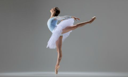

In [44]:
path = Path("sports/predict")
path.mkdir()
dest = 'sports/predict/ballet1.jpg'
download_url("https://hips.hearstapps.com/hmg-prod.s3.amazonaws.com/images/kathryn-morgan-jonathan-givens-eps-image002-1571184287.jpg?resize=480:*", dest)
im = Image.open(dest)
im.to_thumb(128,128)

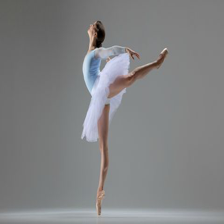

In [46]:
im.resize((224,224))

And now the prediction, this new ballet picture is ballet with almost 1 probability. (No, it's not in the training data, I have checked!)

In [47]:
learn_inf.predict('sports/predict/ballet1.jpg')

('ballet', tensor(0), tensor([1.0000e+00, 3.8249e-09, 3.0691e-10]))

# Creating a Notebook App from the Model with IPython widgets:

In [52]:
btn_upload = widgets.FileUpload()
btn_upload

FileUpload(value={}, description='Upload')

In [53]:
img = PILImage.create(btn_upload.data[-1])

In [54]:
out_pl = widgets.Output()
out_pl.clear_output()
with out_pl: 
    display(img.to_thumb(128,128))
out_pl

Output()

In [55]:
pred,pred_idx,probs = learn_inf.predict(img)
lbl_pred = widgets.Label()
lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'
lbl_pred

Label(value='Prediction: pole fitness; Probability: 0.9994')

Now we create a button to classify without us running anything else:

In [59]:
btn_run = widgets.Button(description='Classify')
btn_run

Button(description='Classify', style=ButtonStyle())

In [60]:
def on_click_classify(change):
    img = PILImage.create(btn_upload.data[-1])
    out_pl.clear_output()
    with out_pl: display(img.to_thumb(128,128))
    pred,pred_idx,probs = learn_inf.predict(img)
    lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'

btn_run.on_click(on_click_classify)

We can now put them all in a vertical box (VBox) to complete our GUI:

In [62]:
btn_upload = widgets.FileUpload()
VBox([widgets.Label('Select your picture!'), 
      btn_upload, btn_run, out_pl, lbl_pred])